# Imports


In [1]:
! pip install gdown
!gdown 13W3xPoFiK4zgPEq0PYByT4qYsZK1v1KK

Downloading...
From: https://drive.google.com/uc?id=13W3xPoFiK4zgPEq0PYByT4qYsZK1v1KK
To: /content/weatherHistory.csv
100% 16.2M/16.2M [00:00<00:00, 143MB/s]


In [2]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression, Perceptron, SGDClassifier
from sklearn.model_selection import train_test_split
import sklearn.datasets as datasets
import matplotlib.pyplot as plt
# ROOT_LOCAL = "D:\desk top folders\ML\MachineLearning2024W"
# %cd {ROOT_LOCAL}

[Errno 2] No such file or directory: 'D:desk top foldersMLMachineLearning2024W'
/content


# Q3

## Initaialize and Load Data


In [3]:
# main_df = pd.read_csv("Projects\\mini project 1\\Q3\\Dataset\\weatherHistory.csv")
main_df = pd.read_csv("/content/weatherHistory.csv")
temp = "Temperature (C)"
app_temp = "Apparent Temperature (C)"
humidity = "Humidity"
main_df.head(5)

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.


In [4]:
df = main_df[[temp,app_temp,humidity]]
df.head(5)

,Temperature (C),Apparent Temperature (C),Humidity
0,9.472222,7.388889,0.89
1,9.355556,7.227778,0.86
2,9.377778,9.377778,0.89
3,8.288889,5.944444,0.83
4,8.755556,6.977778,0.83


## Section 1 - Covariance and Histogram of Data


                          Temperature (C)  Apparent Temperature (C)  Humidity
Temperature (C)                 91.232037                101.418283 -1.180462
Apparent Temperature (C)       101.418283                114.422544 -1.259941
Humidity                        -1.180462                 -1.259941  0.038210


<Axes: >

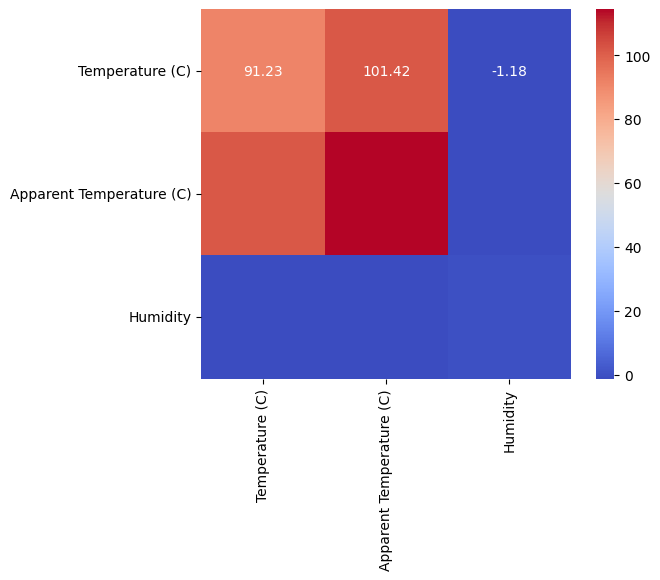

In [ ]:
covariance_matrix = df.cov()
print(covariance_matrix)
sns.heatmap(covariance_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True)


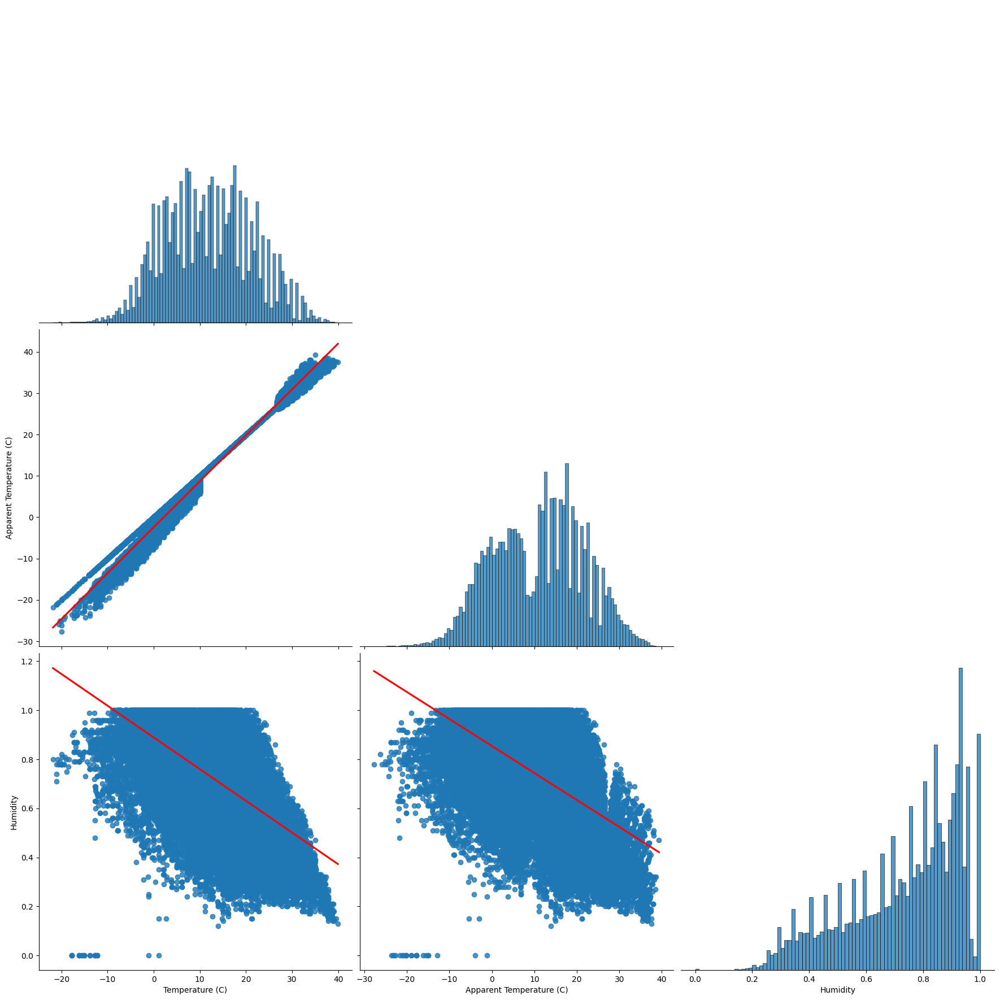

In [ ]:
sns.pairplot(df,kind='reg', height = 6, corner= True,plot_kws={'line_kws':{'color':'red'}})
plt.show()

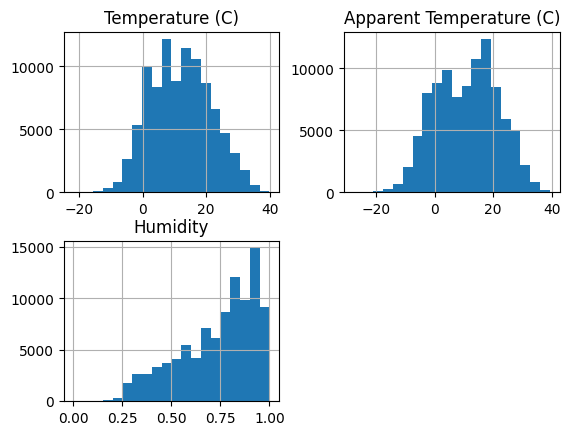

In [ ]:
histogram = df.hist(bins = 20)

## LS and RLS Approximation

### LS

In [8]:
train_set, test_set = train_test_split(df,test_size=0.2,random_state=53)


app_temp_LS  = LinearRegression()
humidity_LS = LinearRegression()
temp_LS = LinearRegression()


LS_models = {app_temp:app_temp_LS.fit(train_set[[temp,humidity]],train_set[[app_temp]] ),
          humidity: humidity_LS.fit(train_set[[temp,app_temp]],train_set[[humidity]]),
          temp: temp_LS.fit(train_set[[app_temp,humidity]],train_set[[temp]])}

In [ ]:
for model in LS_models.keys():
    train_score = LS_models[model].score(train_set.drop(columns=[model]),train_set[[model]])
    test_score = LS_models[model].score(test_set.drop(columns=[model]),test_set[[model]])
    print(f"{model} accuracy on training set is equal to {train_score}")


    print(f"{model} accuracy on testset is equal to {test_score}\n")

Apparent Temperature (C) accuracy on training set is equal to 0.9863194080189283
Apparent Temperature (C) accuracy on testset is equal to 0.9864954840061168

Humidity accuracy on training set is equal to 0.4424797955038111
Humidity accuracy on testset is equal to 0.44192120432173676

Temperature (C) accuracy on training set is equal to 0.9871057929817124
Temperature (C) accuracy on testset is equal to 0.9872771524102542



### RLS

In [ ]:
class RecursiveLeastSquares:
    def __init__(self, n_features, forgetting_factor=0.99):
        self.n_features = n_features
        self.forgetting_factor = forgetting_factor
        self.theta = np.zeros((n_features, 1))  # Initialize model parameters
        self.P = np.eye(n_features)  # Initialize covariance matrix
        self.errors = []
        self.train_mse = []
        self.test_mse = []

    def fit(self, X, y,X_test,y_test):
        for i in range(len(X)):
            x_i = X[i].reshape(-1, 1)
            y_i = y[i]

            # Predict
            y_pred = np.dot(x_i.T, self.theta)

            # Update
            error = y_i - y_pred
            self.errors.append(error)
            K = np.dot(self.P, x_i) / (self.forgetting_factor + np.dot(np.dot(x_i.T, self.P), x_i))
            self.theta = self.theta + np.dot(K, error)
            self.P = (1 / self.forgetting_factor) * (self.P - np.dot(K, np.dot(x_i.T, self.P)))
            if (i+1)%100 ==0 or i ==len(X):
                pred_train = self.predict(X)
                mse_train = np.mean((y - pred_train)**2)
                self.train_mse.append(mse_train)

                pred_test = self.predict(X_test)
                mse_test = np.mean((y_test - pred_test)**2)
                self.test_mse.append(mse_test)

        self.errors=np.array(self.errors).reshape(-1)

        return self



    def predict(self, X):
        return np.dot(X, self.theta)

def plot_loss(data_dict, ff):
    num_plots = len(data_dict)
    fig, axes = plt.subplots(num_plots, 1, figsize=(12, num_plots*4))

    for i, (key, data) in enumerate(data_dict.items()):
        if num_plots == 1:
            ax = axes
        else:
            ax = axes[i]

        ax.plot(data.train_mse, label='Train MSE')
        ax.plot(data.test_mse, linestyle='dashed', label='Test MSE')
        last_mse_test = data.test_mse[-1]
        ax.set_title(key+ f", last mse in test {last_mse_test}")
        ax.set_xlabel("Iteration")
        ax.set_ylabel("Error")
        ax.legend()  # Add legend to the plot

    fig.suptitle(f"forgetting factor={ff}")
    plt.tight_layout()
    plt.show()

In [ ]:
RLS_models = {}
for ff in np.arange(0.1,1,0.1):
	RLS_models[ff] = {app_temp:RecursiveLeastSquares(n_features=2,forgetting_factor=ff).fit(train_set[[temp,humidity]].to_numpy(),
                                                                                            train_set[[app_temp]].to_numpy(),
                                                                                            test_set[[temp,humidity]].to_numpy(),
                                                                                            test_set[[app_temp]].to_numpy(),),

					  humidity: RecursiveLeastSquares(n_features=2,forgetting_factor=ff).fit(train_set[[temp,app_temp]].to_numpy(),
																							 train_set[[humidity]].to_numpy(),
																							 test_set[[temp,app_temp]].to_numpy(),
																							 test_set[[humidity]].to_numpy()),

					  temp: RecursiveLeastSquares(n_features=2,forgetting_factor=ff).fit(train_set[[app_temp,humidity]].to_numpy(),
                                                                          				 train_set[[temp]].to_numpy(),
                                                                               			 test_set[[app_temp,humidity]].to_numpy(),
                                                                          				 test_set[[temp]].to_numpy())}

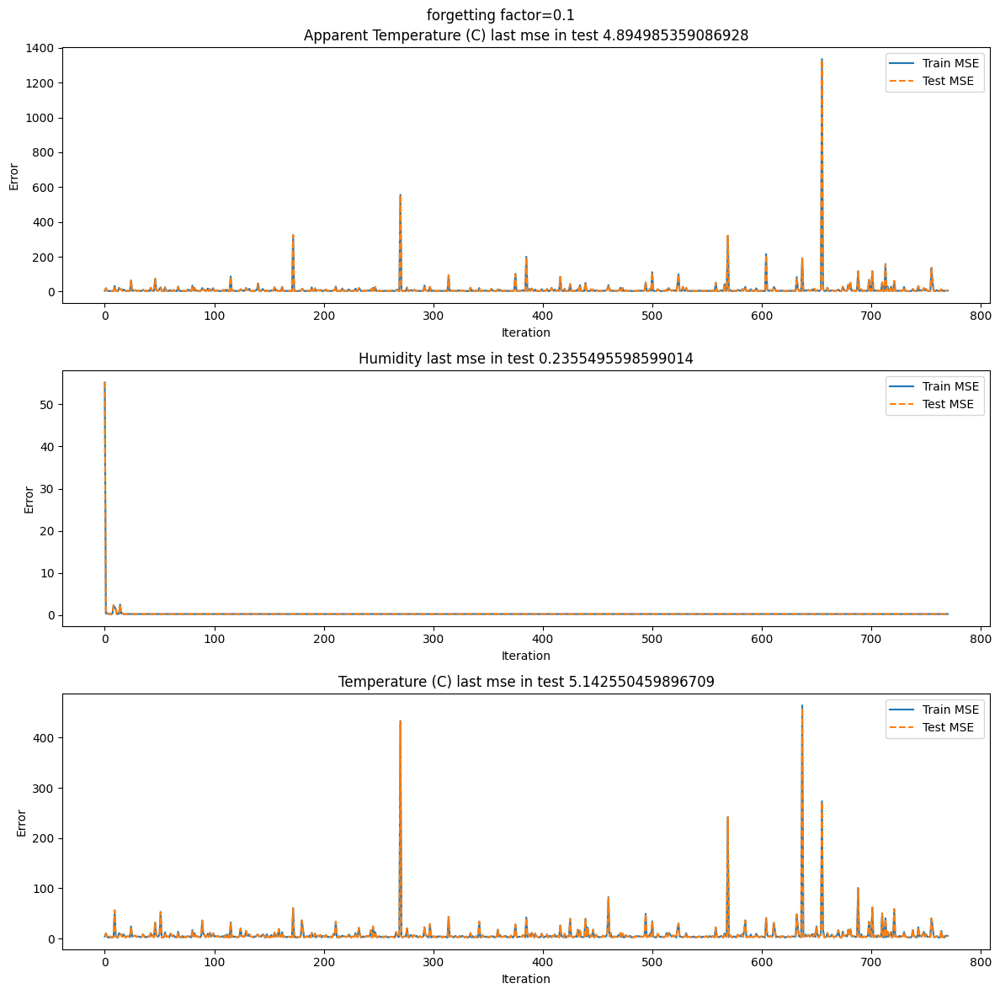

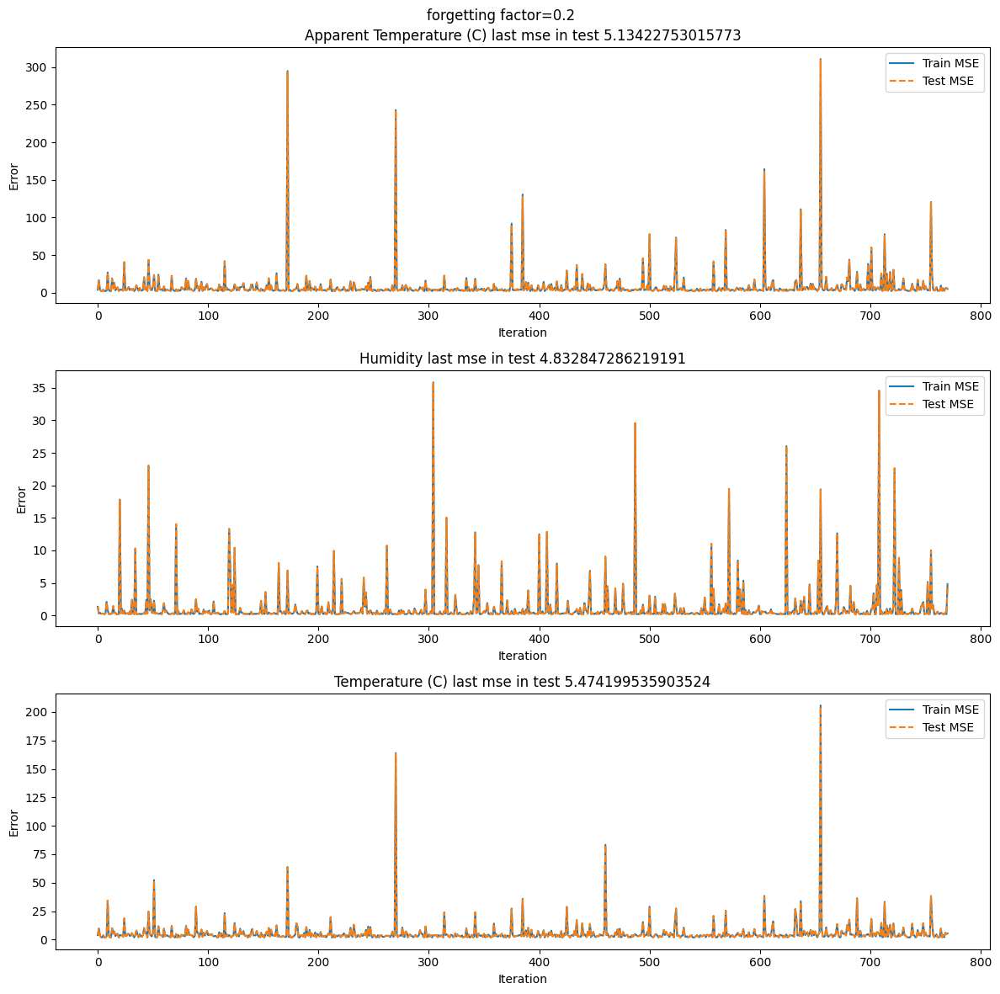

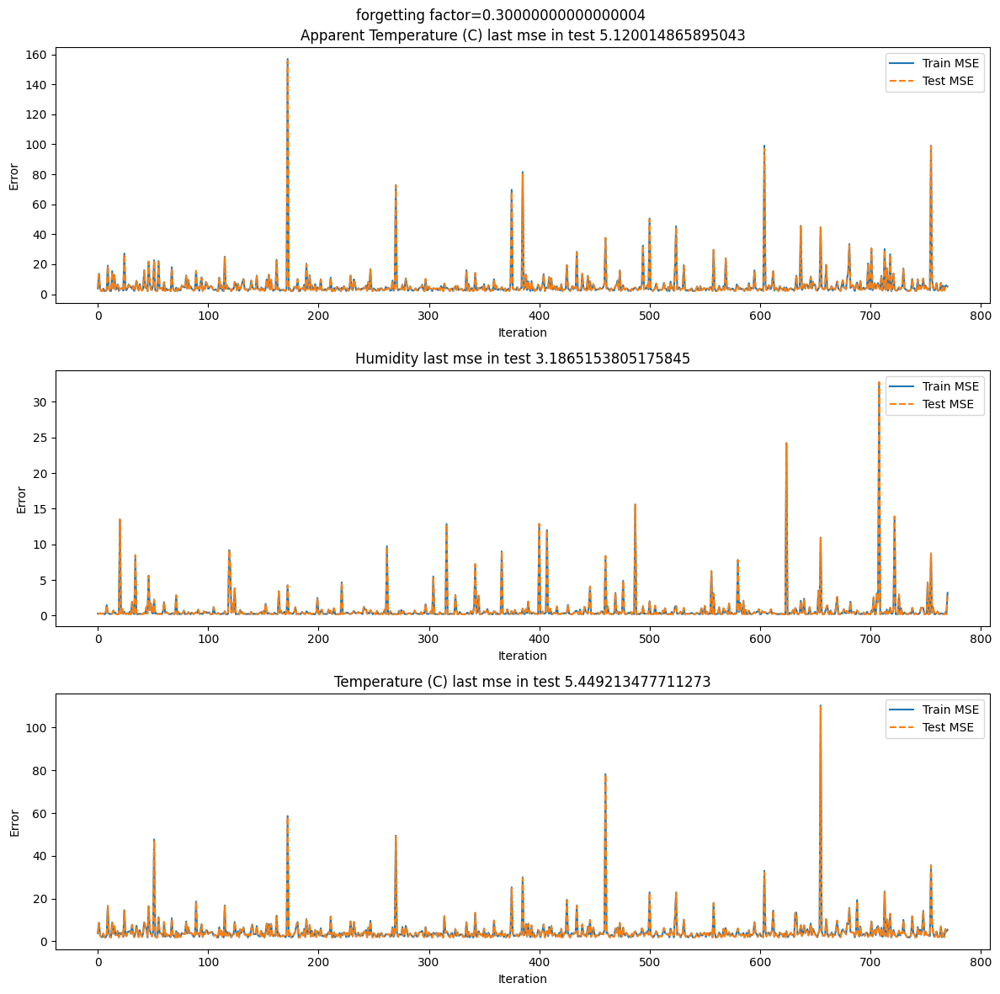

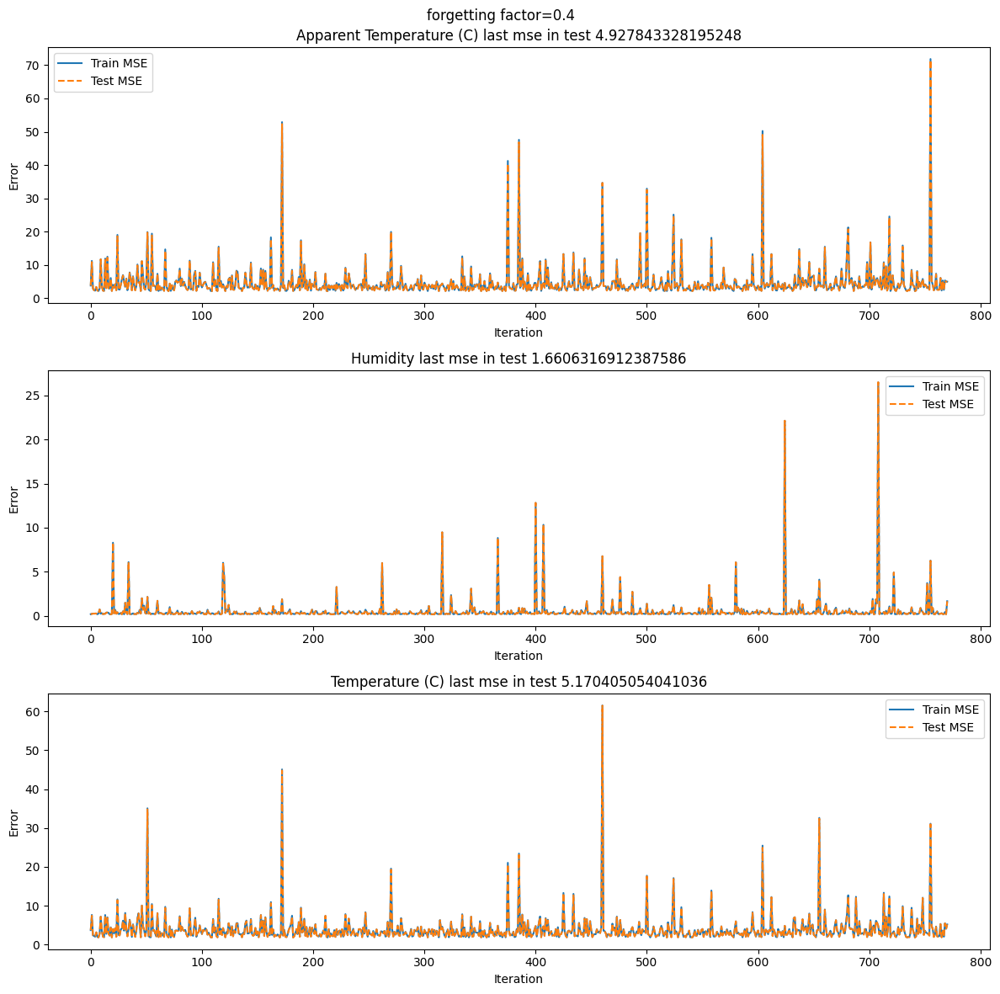

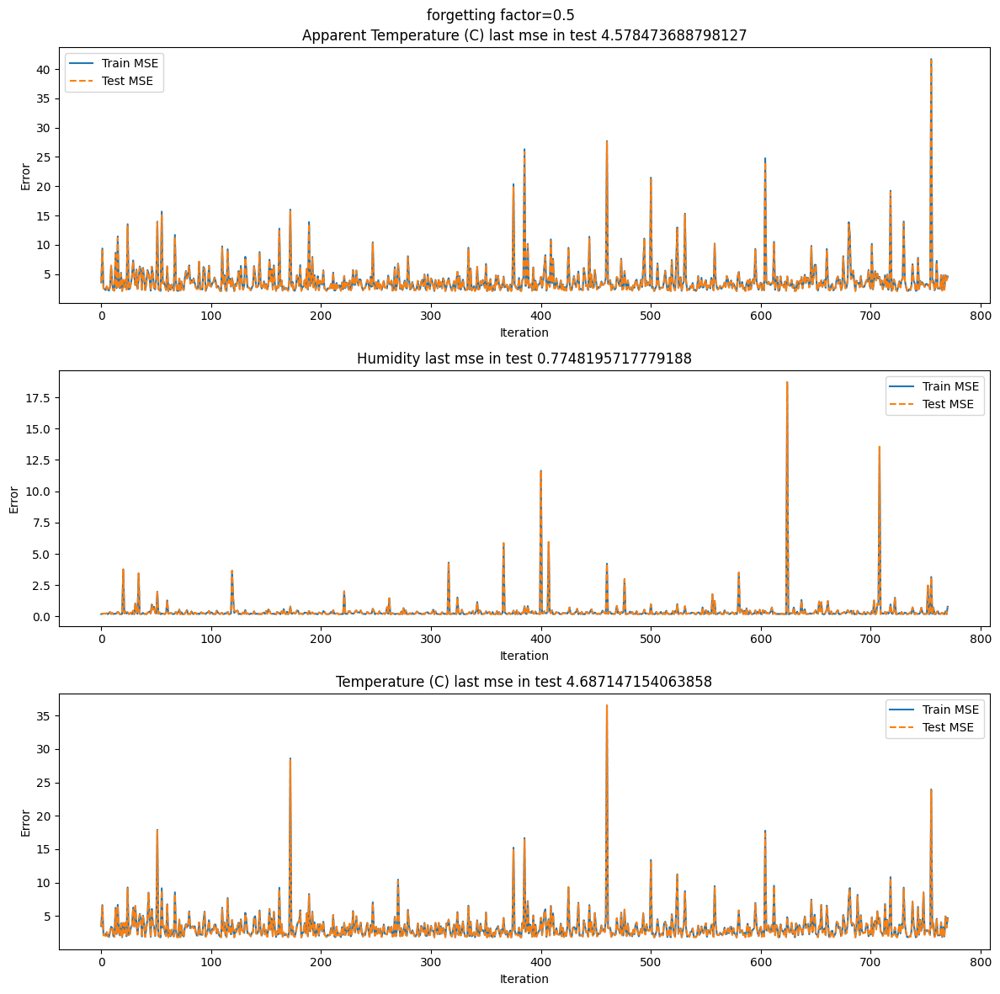

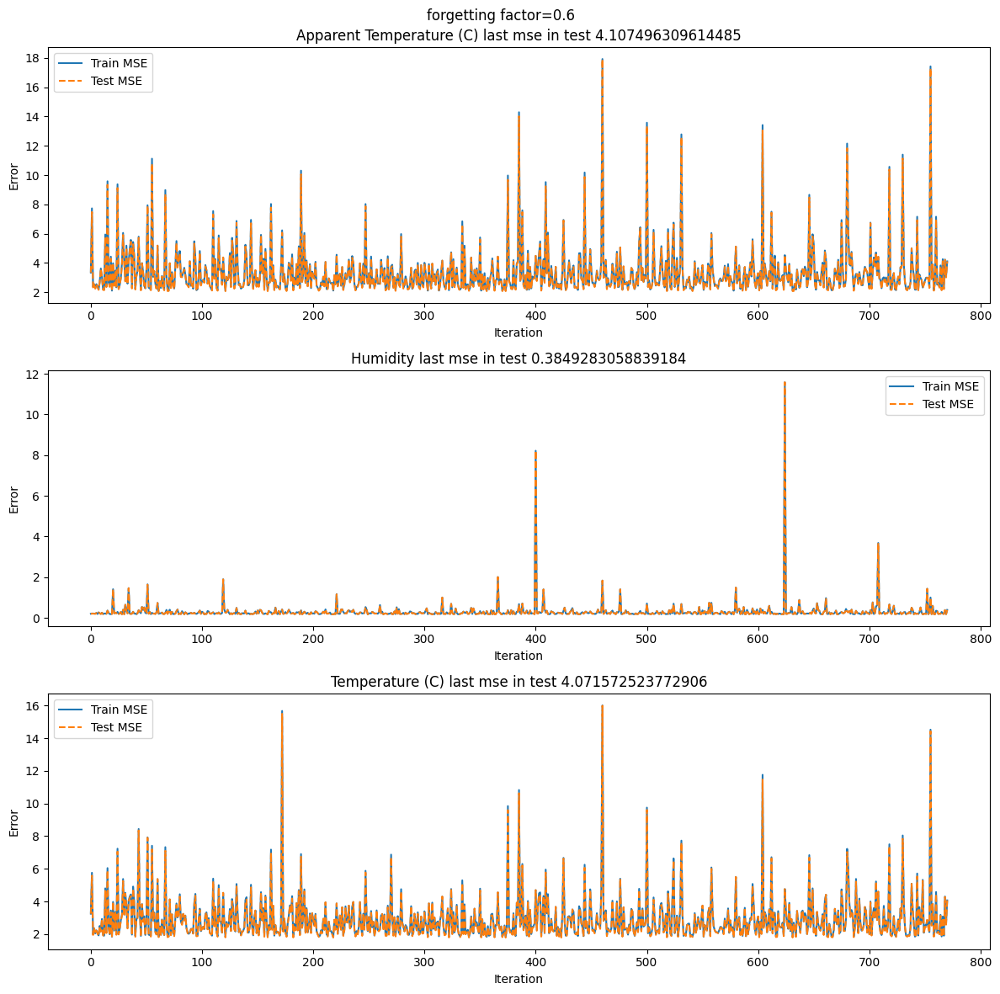

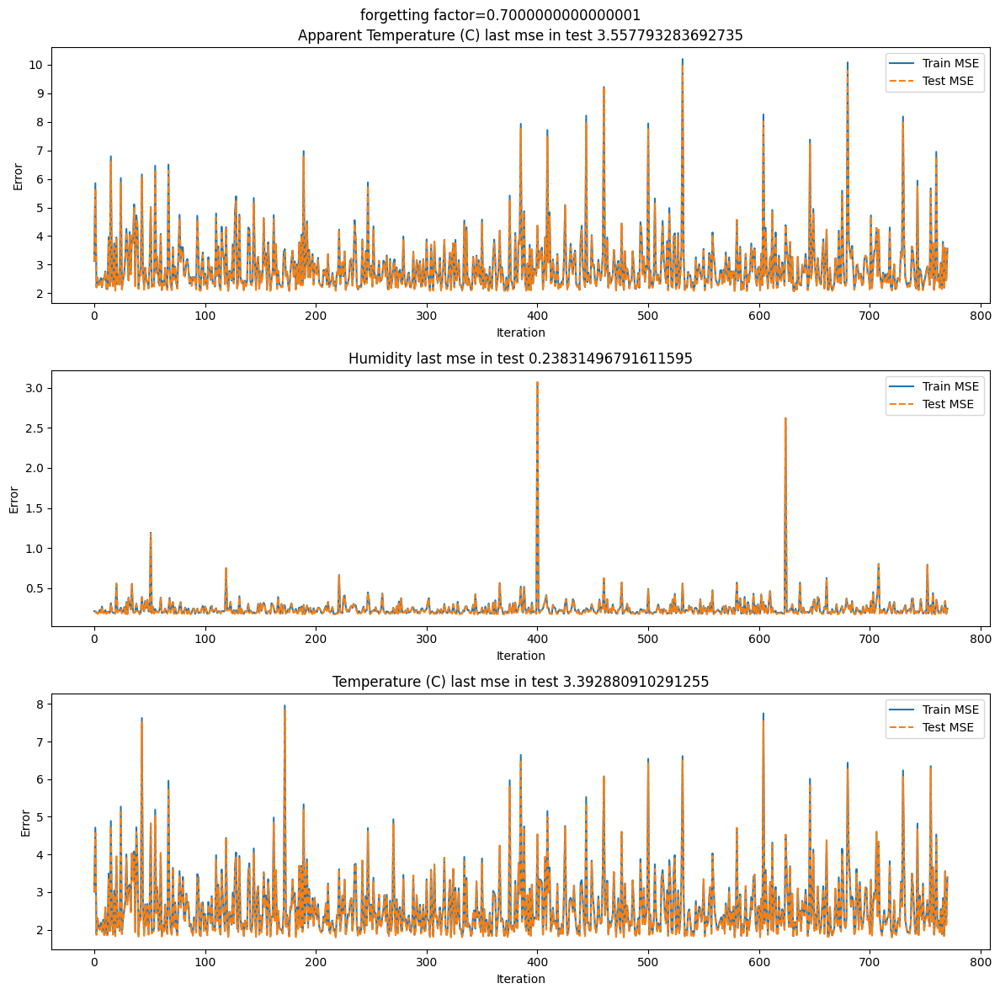

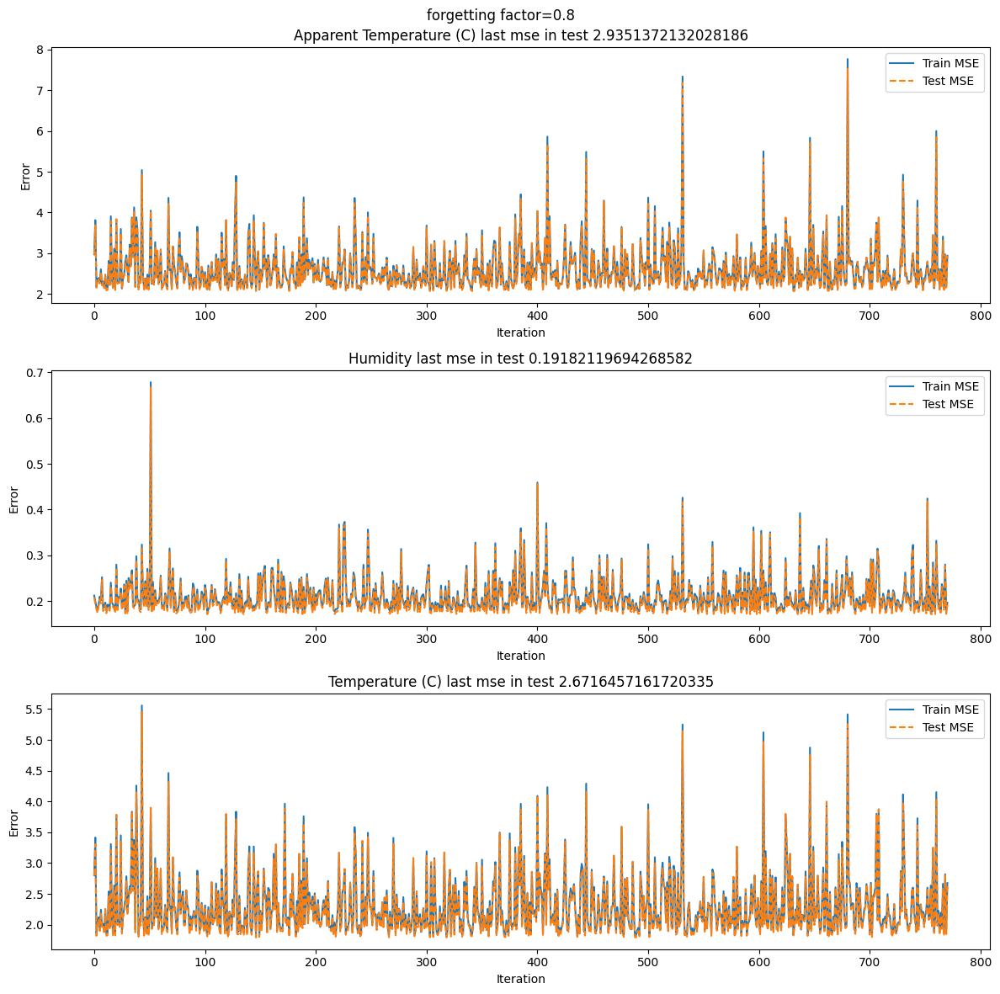

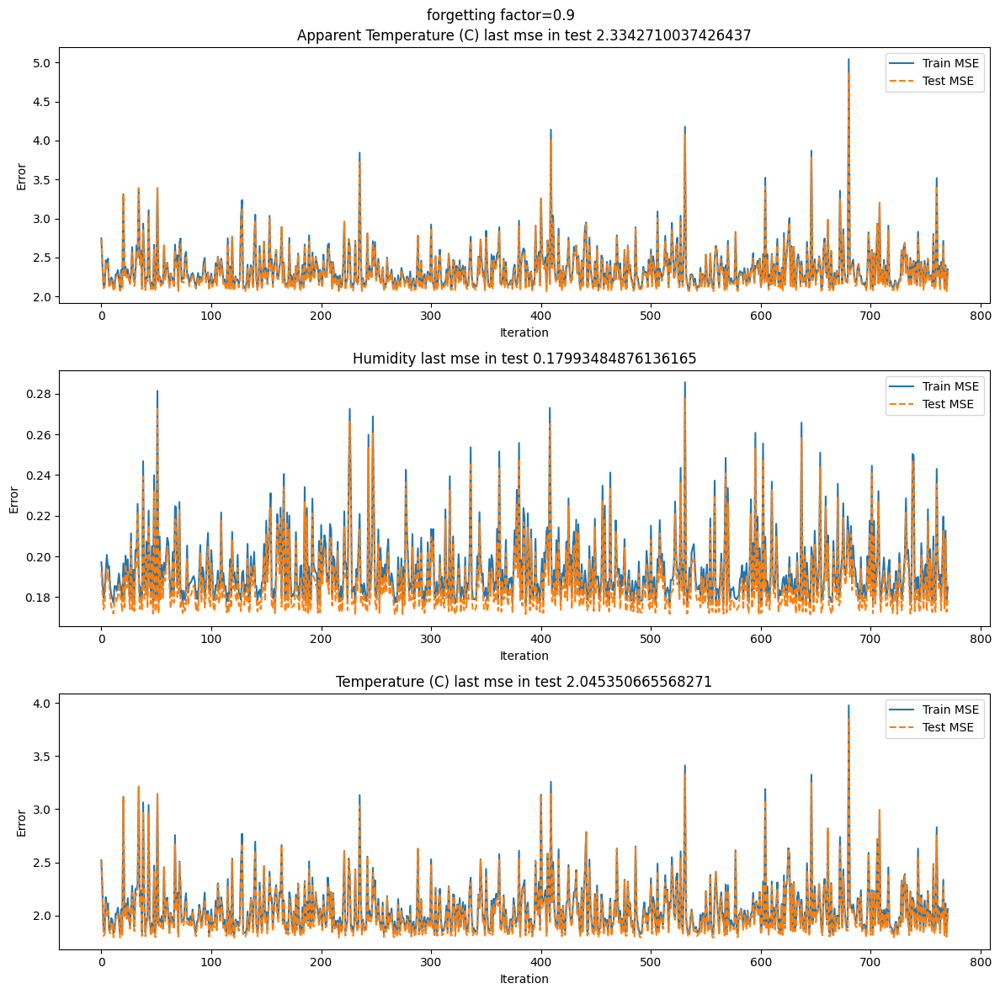

In [ ]:
for i, (ff, model) in enumerate(RLS_models.items()):
    plot_loss(model,ff)

In [ ]:
RLS_models_90_99={}
for ff in np.arange(0.9,1.01,0.01):
	RLS_models_90_99[ff] = {app_temp:RecursiveLeastSquares(n_features=2,forgetting_factor=ff).fit(train_set[[temp,humidity]].to_numpy(),
                                                                                            train_set[[app_temp]].to_numpy(),
                                                                                            test_set[[temp,humidity]].to_numpy(),
                                                                                            test_set[[app_temp]].to_numpy(),),

					  humidity: RecursiveLeastSquares(n_features=2,forgetting_factor=ff).fit(train_set[[temp,app_temp]].to_numpy(),
																							 train_set[[humidity]].to_numpy(),
																							 test_set[[temp,app_temp]].to_numpy(),
																							 test_set[[humidity]].to_numpy()),

					  temp: RecursiveLeastSquares(n_features=2,forgetting_factor=ff).fit(train_set[[app_temp,humidity]].to_numpy(),
                                                                          				 train_set[[temp]].to_numpy(),
                                                                               			 test_set[[app_temp,humidity]].to_numpy(),
                                                                          				 test_set[[temp]].to_numpy())}

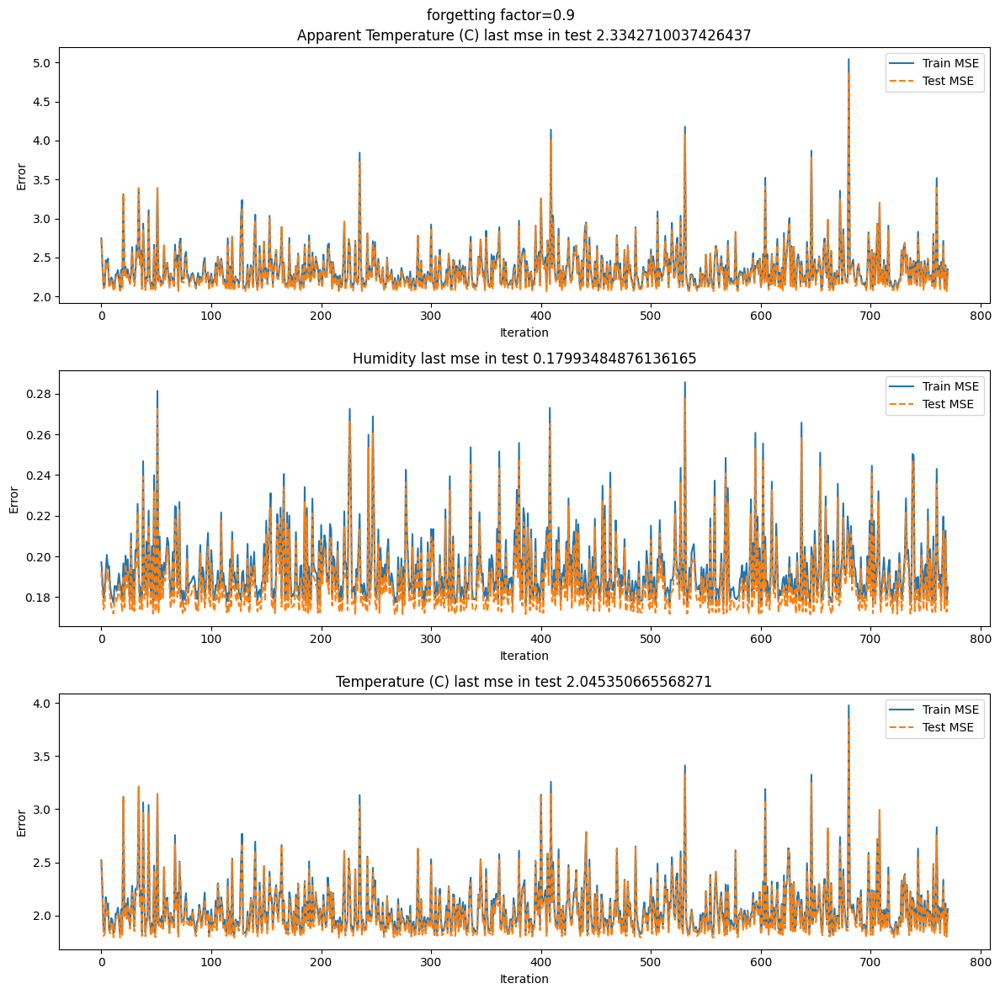

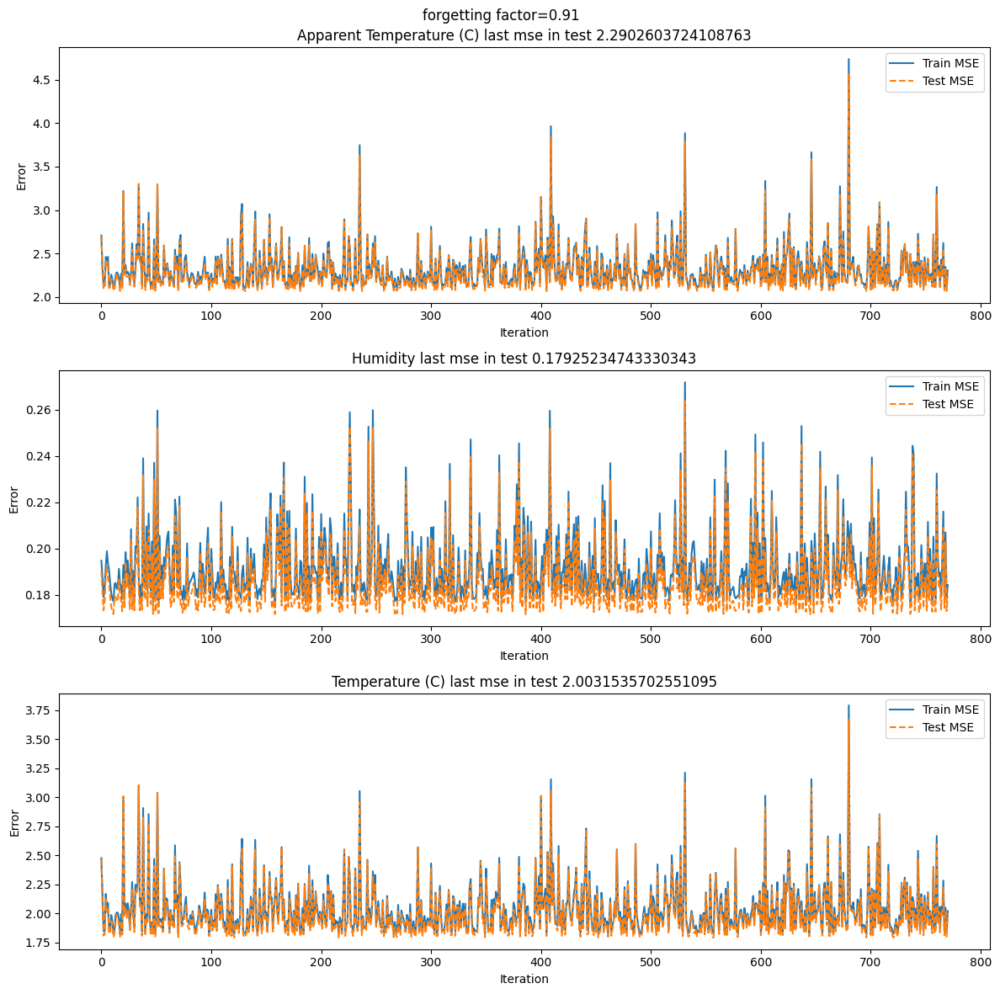

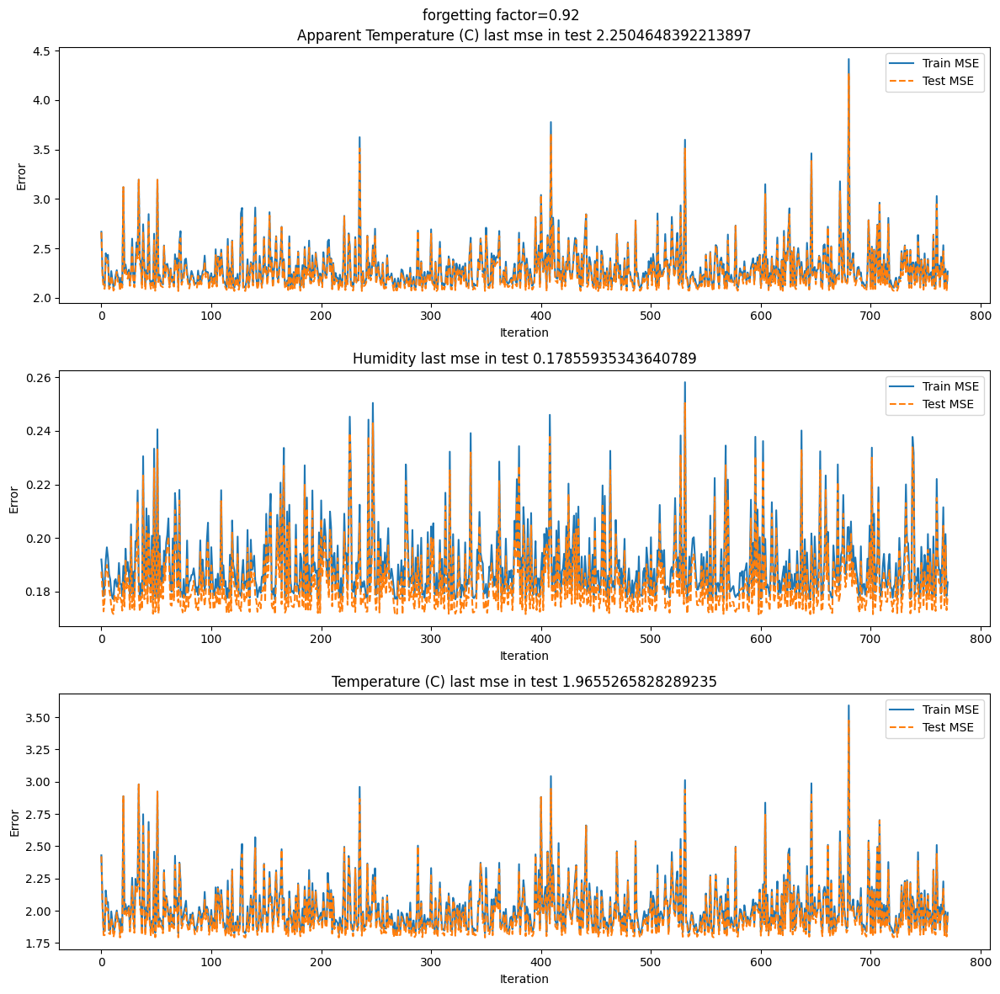

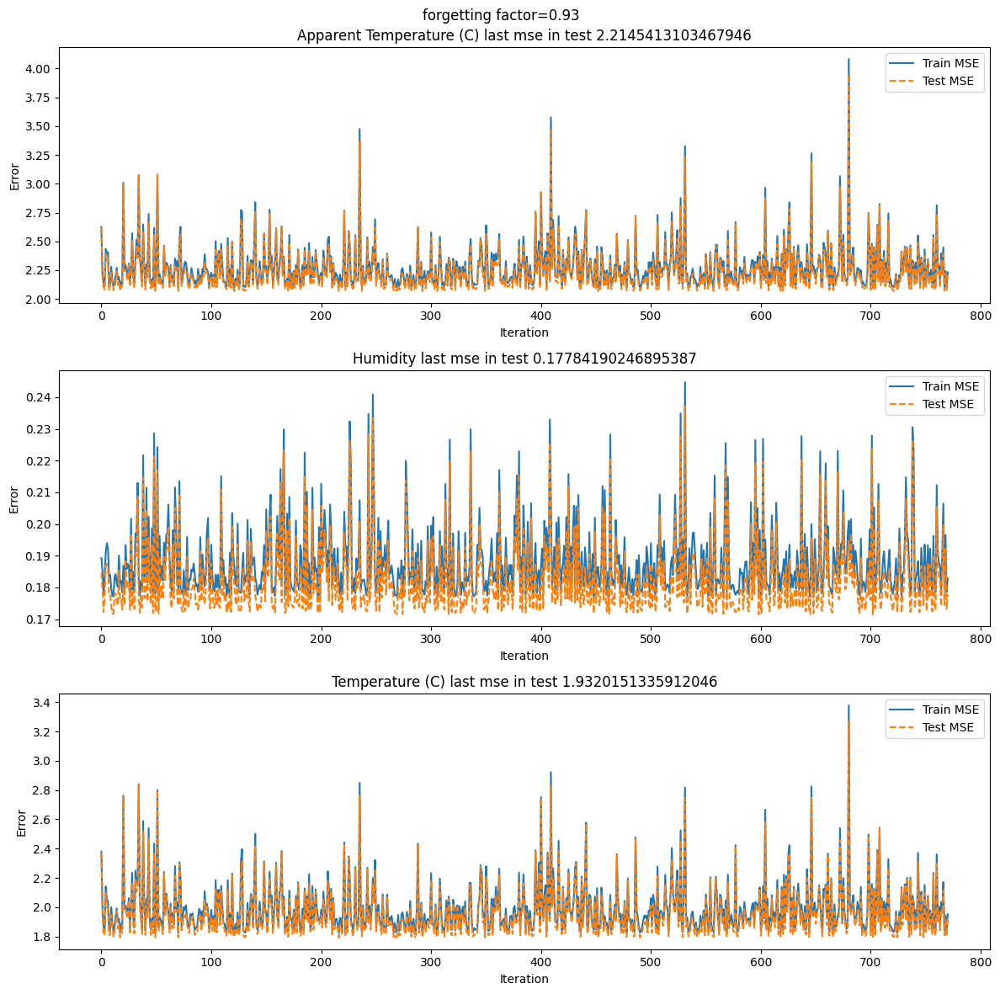

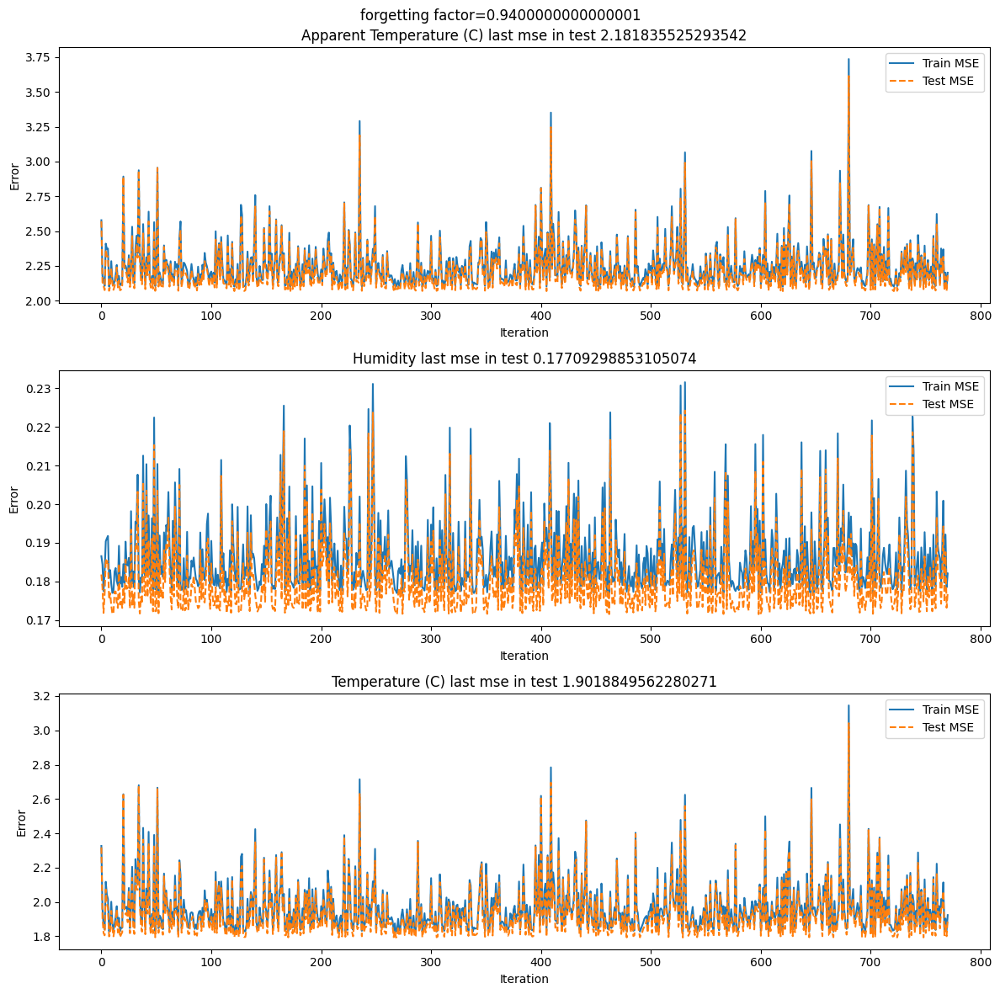

...

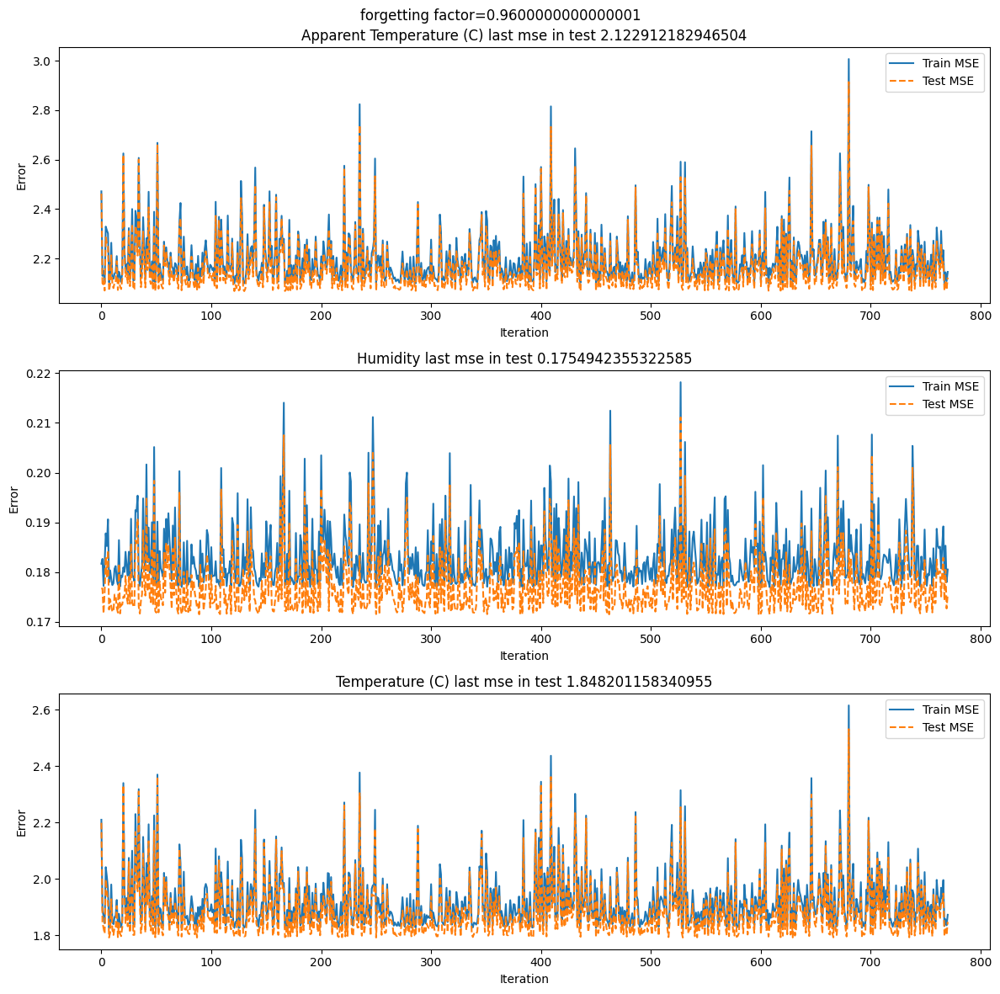

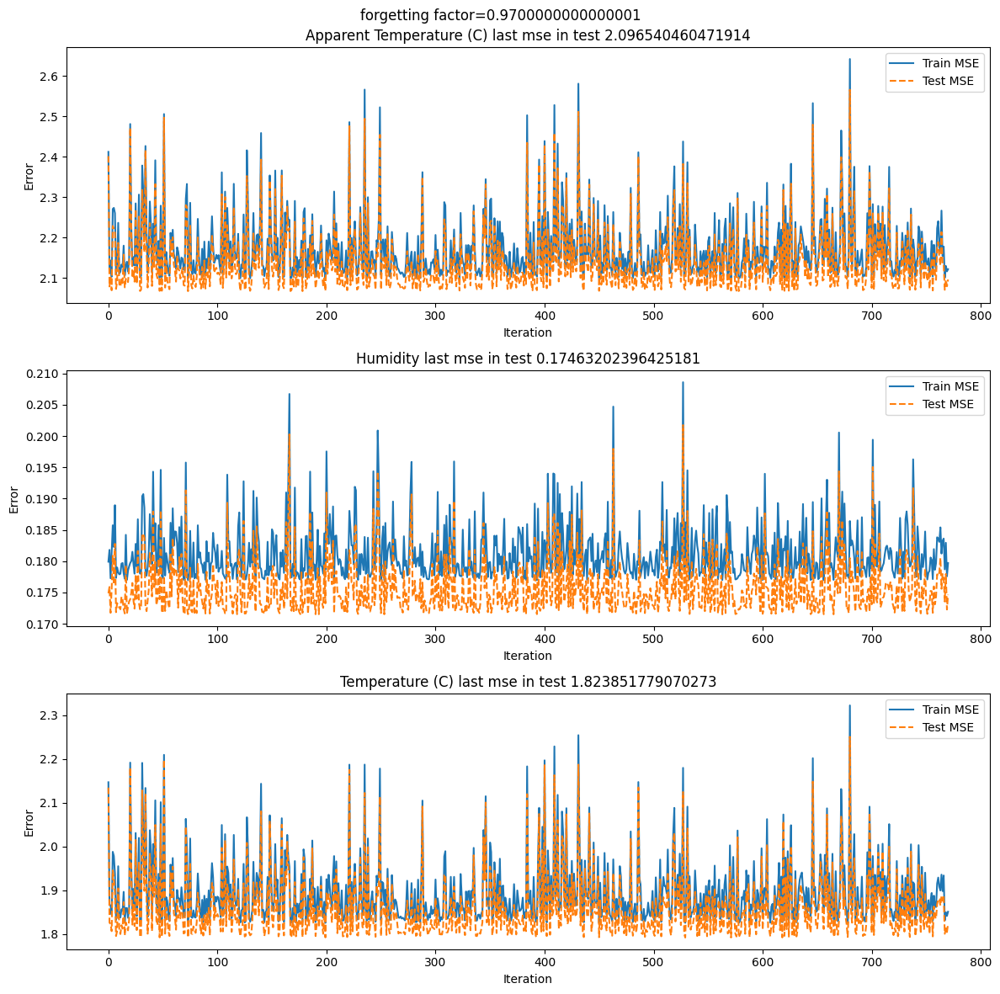

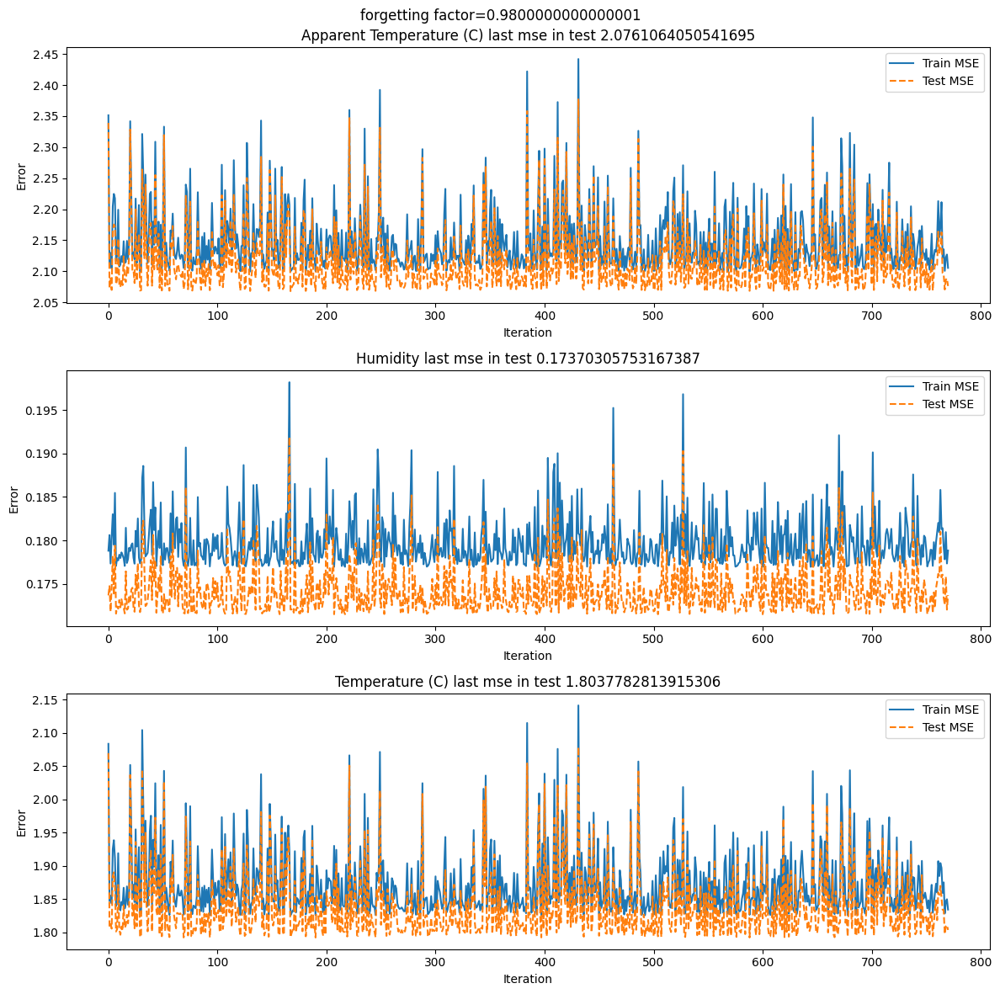

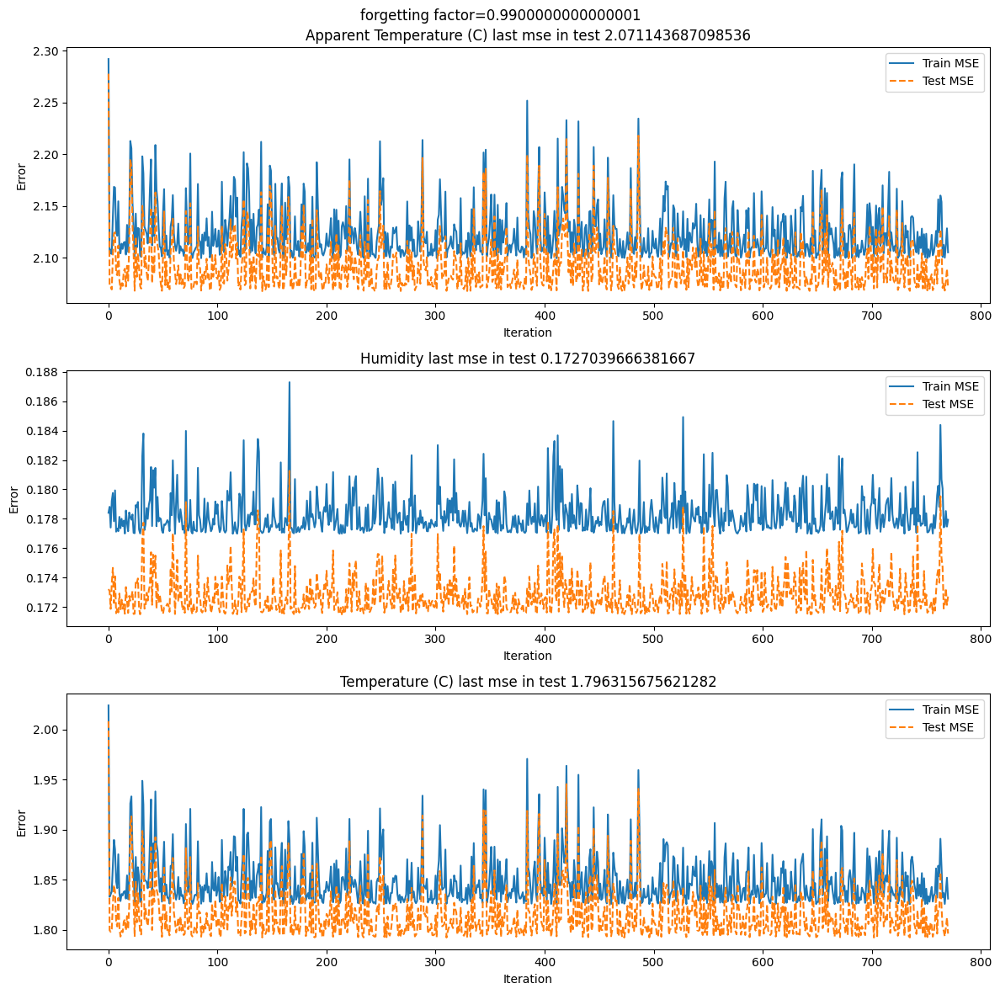

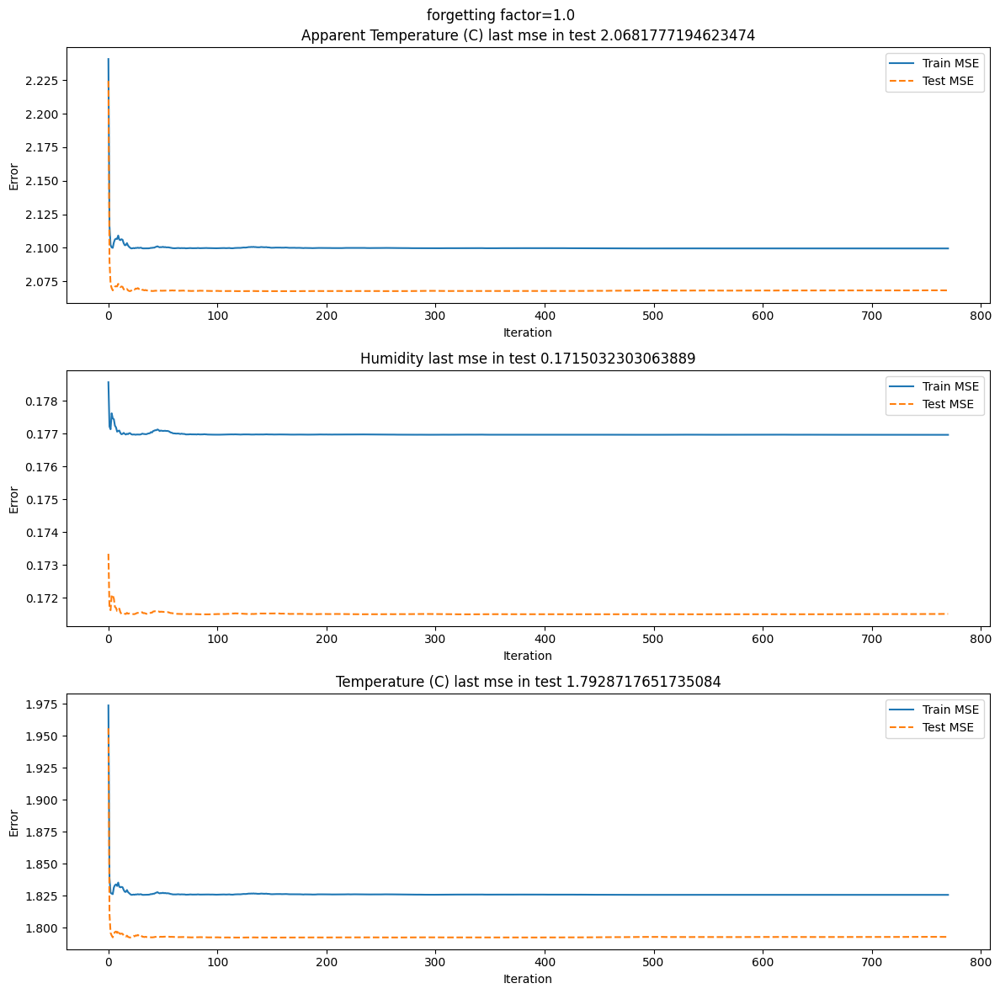

In [ ]:
for i, (ff, model) in enumerate(RLS_models_90_99.items()):
    plot_loss(model,ff)

### WLS

In [32]:
import statsmodels.api as sm

train_set_intercept = sm.add_constant(train_set)
error_variance = list(range(1,len(train_set_intercept)+1))
weights = 1/np.array(error_variance)
WLS_models = {app_temp: sm.WLS(train_set_intercept[[app_temp]], train_set_intercept.drop(app_temp,axis=1), weights=weights).fit(),
              humidity: sm.WLS(train_set_intercept[[humidity]], train_set_intercept.drop(humidity,axis=1), weights=weights).fit(),
              temp: sm.WLS(train_set_intercept[[temp]], train_set_intercept.drop(temp,axis=1), weights=weights).fit()}
# # Print the model summary
print(WLS_models[app_temp].summary())
print(WLS_models[humidity].summary())
print(WLS_models[temp].summary())

AttributeError: 'WLS' object has no attribute 'summary'

In [30]:
test_set_intercept = sm.add_constant(test_set)

for i, (key, model) in enumerate(WLS_models.items()):
    predictions = model.predict(test_set_intercept.drop(key, axis=1))
    r2 = r2_score(test_set[key], predictions)
    print("R^2 Score on test set:", r2)


1.1472804414195734